Adapted from https://colab.research.google.com/github/johko/computer-vision-course/blob/main/notebooks/Unit%203%20-%20Vision%20Transformers/transfer-learning-image-classification.ipynb#scrollTo=-ADaMen8S9M1

In [1]:
!pip install --quiet evaluate


[notice] A new release of pip is available: 25.0.1 -> 25.1.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [ ]:
import io
from PIL import Image
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
from huggingface_hub import notebook_login
from datasets import load_dataset, DatasetDict
from transformers import AutoImageProcessor, ViTForImageClassification
from transformers import Trainer, TrainingArguments
import evaluate

In [3]:
dataset = load_dataset("imagefolder", data_dir="D:/Study/resics_applied_ml_project/splitted_data")

Resolving data files:   0%|          | 0/25200 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/6300 [00:00<?, ?it/s]

In [4]:
train_dataset = dataset["train"]
class_names = train_dataset.features["label"].names
print(f"Number of classes: {len(class_names)}")
print(f"Class names (folder names): {class_names}")

Number of classes: 45
Class names (folder names): ['airplane', 'airport', 'baseball_diamond', 'basketball_court', 'beach', 'bridge', 'chaparral', 'church', 'circular_farmland', 'cloud', 'commercial_area', 'dense_residential', 'desert', 'forest', 'freeway', 'golf_course', 'ground_track_field', 'harbor', 'industrial_area', 'intersection', 'island', 'lake', 'meadow', 'medium_residential', 'mobile_home_park', 'mountain', 'overpass', 'palace', 'parking_lot', 'railway', 'railway_station', 'rectangular_farmland', 'river', 'roundabout', 'runway', 'sea_ice', 'ship', 'snowberg', 'sparse_residential', 'stadium', 'storage_tank', 'tennis_court', 'terrace', 'thermal_power_station', 'wetland']


In [5]:
dataset['train'][0]

{'image': <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=256x256>,
 'label': 0}

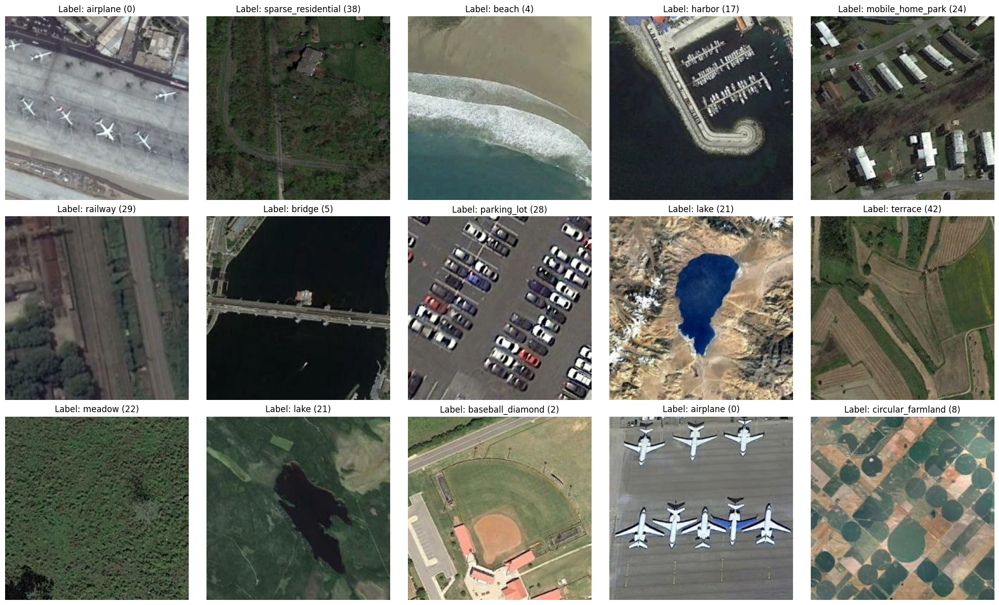

In [6]:
def show_samples(ds,rows,cols):
    samples = ds.shuffle().select(np.arange(rows*cols))
    fig = plt.figure(figsize=(cols*4,rows*4))
    for i, sample in enumerate(samples):
        img = sample['image']
        label_id = sample['label']

        if img.mode != 'RGB':
            img = img.convert('RGB')

        fig.add_subplot(rows, cols, i + 1)
        plt.imshow(img)
        plt.title(f"Label: {class_names[label_id]} ({label_id})")
        plt.axis('off')
    plt.tight_layout()
    plt.show()

show_samples(dataset['train'],rows=3,cols=5)

In [ ]:
split_dataset = dataset['train'].train_test_split(test_size=0.2)
eval_dataset = split_dataset['test'].train_test_split(test_size=0.5)
our_dataset = DatasetDict({
    'train': split_dataset['train'],
    'validation': eval_dataset['train'],
    'test': eval_dataset['test']
})

our_dataset

DatasetDict({
    train: Dataset({
        features: ['image', 'label'],
        num_rows: 20160
    })
    validation: Dataset({
        features: ['image', 'label'],
        num_rows: 2520
    })
    test: Dataset({
        features: ['image', 'label'],
        num_rows: 2520
    })
})

In [8]:
label2id = {c:idx for idx,c in enumerate(class_names)}
id2label = {idx:c for idx,c in enumerate(class_names)}

In [9]:
processor = AutoImageProcessor.from_pretrained('google/vit-base-patch16-224')
processor

c:\Users\user\AppData\Local\Programs\Python\Python310\lib\site-packages\huggingface_hub\file_download.py:797: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(


ViTImageProcessor {
  "do_normalize": true,
  "do_rescale": true,
  "do_resize": true,
  "image_mean": [
    0.5,
    0.5,
    0.5
  ],
  "image_processor_type": "ViTImageProcessor",
  "image_std": [
    0.5,
    0.5,
    0.5
  ],
  "resample": 2,
  "rescale_factor": 0.00392156862745098,
  "size": {
    "height": 224,
    "width": 224
  }
}

In [10]:
def transforms(batch):
    #batch['image'] = [Image.open(io.BytesIO(x['bytes'])).convert('RGB') for x in batch['image']]
    processed_images = processor(batch['image'], return_tensors='pt')
    inputs = {}
    inputs['pixel_values'] = processed_images['pixel_values']
    if 'label' in batch:
        inputs['labels'] = batch['label']
        
    return inputs

In [11]:
processed_dataset = our_dataset.with_transform(transforms)

In [12]:
def collate_fn(batch):
    return {
        'pixel_values': torch.stack([x['pixel_values'] for x in batch]),
        'labels': torch.tensor([x['labels'] for x in batch])
    }

In [13]:
accuracy = evaluate.load('accuracy')
def compute_metrics(eval_preds):
    logits, labels = eval_preds
    predictions = np.argmax(logits,axis=1)
    score = accuracy.compute(predictions=predictions, references=labels)
    return score

In [14]:
model = ViTForImageClassification.from_pretrained(
    'google/vit-base-patch16-224',
    num_labels = len(class_names),
    id2label = id2label,
    label2id = label2id,
    ignore_mismatched_sizes = True
)

Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224 and are newly initialized because the shapes did not match:
- classifier.bias: found shape torch.Size([1000]) in the checkpoint and torch.Size([45]) in the model instantiated
- classifier.weight: found shape torch.Size([1000, 768]) in the checkpoint and torch.Size([45, 768]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [15]:
model

ViTForImageClassification(
  (vit): ViTModel(
    (embeddings): ViTEmbeddings(
      (patch_embeddings): ViTPatchEmbeddings(
        (projection): Conv2d(3, 768, kernel_size=(16, 16), stride=(16, 16))
      )
      (dropout): Dropout(p=0.0, inplace=False)
    )
    (encoder): ViTEncoder(
      (layer): ModuleList(
        (0-11): 12 x ViTLayer(
          (attention): ViTAttention(
            (attention): ViTSelfAttention(
              (query): Linear(in_features=768, out_features=768, bias=True)
              (key): Linear(in_features=768, out_features=768, bias=True)
              (value): Linear(in_features=768, out_features=768, bias=True)
              (dropout): Dropout(p=0.0, inplace=False)
            )
            (output): ViTSelfOutput(
              (dense): Linear(in_features=768, out_features=768, bias=True)
              (dropout): Dropout(p=0.0, inplace=False)
            )
          )
          (intermediate): ViTIntermediate(
            (dense): Linear(in_features=7

In [ ]:
# Uncomment to freeze the layers
# for name,p in model.named_parameters():
#     if not name.startswith('classifier'):
#         p.requires_grad = False

In [17]:
num_params = sum([p.numel() for p in model.parameters()])
trainable_params = sum([p.numel() for p in model.parameters() if p.requires_grad])

print(f"{num_params = :,} | {trainable_params = :,}")

num_params = 85,833,261 | trainable_params = 85,833,261


In [18]:
training_args = TrainingArguments(
    output_dir="./vit-base-oxford-iiit-pets",
    per_device_train_batch_size=16,
    evaluation_strategy="epoch",
    save_strategy="epoch",
    logging_steps=100,
    num_train_epochs=10,
    learning_rate=3e-4,
    save_total_limit=2,
    remove_unused_columns=False,
    report_to='tensorboard',
    load_best_model_at_end=True,
)

In [19]:
trainer = Trainer(
    model=model,
    args=training_args,
    data_collator=collate_fn,
    compute_metrics=compute_metrics,
    train_dataset=processed_dataset["train"],
    eval_dataset=processed_dataset["validation"],
    tokenizer=processor
)

In [20]:
trainer.train()

c:\Users\user\AppData\Local\Programs\Python\Python310\lib\site-packages\transformers\optimization.py:391: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning
  warnings.warn(


  0%|          | 0/12600 [00:00<?, ?it/s]

{'loss': 1.887, 'learning_rate': 0.0002976190476190476, 'epoch': 0.08}
{'loss': 0.9516, 'learning_rate': 0.0002952380952380952, 'epoch': 0.16}
{'loss': 0.7336, 'learning_rate': 0.00029285714285714283, 'epoch': 0.24}
{'loss': 0.6304, 'learning_rate': 0.00029047619047619045, 'epoch': 0.32}
{'loss': 0.6351, 'learning_rate': 0.00028809523809523806, 'epoch': 0.4}
{'loss': 0.5578, 'learning_rate': 0.0002857142857142857, 'epoch': 0.48}
{'loss': 0.6269, 'learning_rate': 0.0002833333333333333, 'epoch': 0.56}
{'loss': 0.5739, 'learning_rate': 0.0002809523809523809, 'epoch': 0.63}
{'loss': 0.4705, 'learning_rate': 0.00027857142857142854, 'epoch': 0.71}
{'loss': 0.5722, 'learning_rate': 0.00027619047619047615, 'epoch': 0.79}
{'loss': 0.5276, 'learning_rate': 0.00027380952380952377, 'epoch': 0.87}
{'loss': 0.4775, 'learning_rate': 0.0002714285714285714, 'epoch': 0.95}


  0%|          | 0/315 [00:00<?, ?it/s]

{'eval_loss': 0.4224618077278137, 'eval_accuracy': 0.8702380952380953, 'eval_runtime': 33.5973, 'eval_samples_per_second': 75.006, 'eval_steps_per_second': 9.376, 'epoch': 1.0}
{'loss': 0.3998, 'learning_rate': 0.000269047619047619, 'epoch': 1.03}
{'loss': 0.3473, 'learning_rate': 0.0002666666666666666, 'epoch': 1.11}
{'loss': 0.31, 'learning_rate': 0.00026428571428571424, 'epoch': 1.19}
{'loss': 0.3031, 'learning_rate': 0.00026190476190476186, 'epoch': 1.27}
{'loss': 0.3457, 'learning_rate': 0.00025952380952380953, 'epoch': 1.35}
{'loss': 0.3483, 'learning_rate': 0.0002571428571428571, 'epoch': 1.43}
{'loss': 0.3271, 'learning_rate': 0.0002547619047619047, 'epoch': 1.51}
{'loss': 0.3511, 'learning_rate': 0.0002523809523809524, 'epoch': 1.59}
{'loss': 0.2947, 'learning_rate': 0.00025, 'epoch': 1.67}
{'loss': 0.3115, 'learning_rate': 0.00024761904761904757, 'epoch': 1.75}
{'loss': 0.3574, 'learning_rate': 0.0002452380952380952, 'epoch': 1.83}
{'loss': 0.3241, 'learning_rate': 0.00024285

  0%|          | 0/315 [00:00<?, ?it/s]

{'eval_loss': 0.40089237689971924, 'eval_accuracy': 0.8726190476190476, 'eval_runtime': 28.9444, 'eval_samples_per_second': 87.063, 'eval_steps_per_second': 10.883, 'epoch': 2.0}
{'loss': 0.2273, 'learning_rate': 0.00023809523809523807, 'epoch': 2.06}
{'loss': 0.1801, 'learning_rate': 0.00023571428571428569, 'epoch': 2.14}
{'loss': 0.1849, 'learning_rate': 0.0002333333333333333, 'epoch': 2.22}
{'loss': 0.2084, 'learning_rate': 0.00023095238095238095, 'epoch': 2.3}
{'loss': 0.1604, 'learning_rate': 0.00022857142857142854, 'epoch': 2.38}
{'loss': 0.207, 'learning_rate': 0.00022619047619047616, 'epoch': 2.46}
{'loss': 0.2317, 'learning_rate': 0.0002238095238095238, 'epoch': 2.54}
{'loss': 0.1653, 'learning_rate': 0.00022142857142857142, 'epoch': 2.62}
{'loss': 0.2162, 'learning_rate': 0.000219047619047619, 'epoch': 2.7}
{'loss': 0.1783, 'learning_rate': 0.00021666666666666666, 'epoch': 2.78}
{'loss': 0.2049, 'learning_rate': 0.00021428571428571427, 'epoch': 2.86}
{'loss': 0.2552, 'learnin

  0%|          | 0/315 [00:00<?, ?it/s]

{'eval_loss': 0.3913930356502533, 'eval_accuracy': 0.8896825396825396, 'eval_runtime': 26.5253, 'eval_samples_per_second': 95.004, 'eval_steps_per_second': 11.875, 'epoch': 3.0}
{'loss': 0.1782, 'learning_rate': 0.00020952380952380948, 'epoch': 3.02}
{'loss': 0.0945, 'learning_rate': 0.00020714285714285713, 'epoch': 3.1}
{'loss': 0.1107, 'learning_rate': 0.00020476190476190475, 'epoch': 3.17}
{'loss': 0.1152, 'learning_rate': 0.00020238095238095236, 'epoch': 3.25}
{'loss': 0.1164, 'learning_rate': 0.00019999999999999998, 'epoch': 3.33}
{'loss': 0.0878, 'learning_rate': 0.0001976190476190476, 'epoch': 3.41}
{'loss': 0.1169, 'learning_rate': 0.00019523809523809522, 'epoch': 3.49}
{'loss': 0.1337, 'learning_rate': 0.00019285714285714286, 'epoch': 3.57}
{'loss': 0.1509, 'learning_rate': 0.00019047619047619045, 'epoch': 3.65}
{'loss': 0.1259, 'learning_rate': 0.00018809523809523807, 'epoch': 3.73}
{'loss': 0.1213, 'learning_rate': 0.00018571428571428572, 'epoch': 3.81}
{'loss': 0.1146, 'lea

  0%|          | 0/315 [00:00<?, ?it/s]

{'eval_loss': 0.29190555214881897, 'eval_accuracy': 0.9218253968253968, 'eval_runtime': 26.5895, 'eval_samples_per_second': 94.774, 'eval_steps_per_second': 11.847, 'epoch': 4.0}
{'loss': 0.0726, 'learning_rate': 0.00017857142857142854, 'epoch': 4.05}
{'loss': 0.0524, 'learning_rate': 0.0001761904761904762, 'epoch': 4.13}
{'loss': 0.0671, 'learning_rate': 0.0001738095238095238, 'epoch': 4.21}
{'loss': 0.0742, 'learning_rate': 0.0001714285714285714, 'epoch': 4.29}
{'loss': 0.0681, 'learning_rate': 0.00016904761904761904, 'epoch': 4.37}
{'loss': 0.0399, 'learning_rate': 0.00016666666666666666, 'epoch': 4.44}
{'loss': 0.0586, 'learning_rate': 0.00016428571428571428, 'epoch': 4.52}
{'loss': 0.0656, 'learning_rate': 0.00016190476190476187, 'epoch': 4.6}
{'loss': 0.0714, 'learning_rate': 0.00015952380952380951, 'epoch': 4.68}
{'loss': 0.0549, 'learning_rate': 0.00015714285714285713, 'epoch': 4.76}
{'loss': 0.056, 'learning_rate': 0.00015476190476190478, 'epoch': 4.84}
{'loss': 0.0858, 'learn

  0%|          | 0/315 [00:00<?, ?it/s]

{'eval_loss': 0.3755592107772827, 'eval_accuracy': 0.9194444444444444, 'eval_runtime': 28.9506, 'eval_samples_per_second': 87.045, 'eval_steps_per_second': 10.881, 'epoch': 5.0}
{'loss': 0.0343, 'learning_rate': 0.0001476190476190476, 'epoch': 5.08}
{'loss': 0.0333, 'learning_rate': 0.00014523809523809522, 'epoch': 5.16}
{'loss': 0.035, 'learning_rate': 0.00014285714285714284, 'epoch': 5.24}
{'loss': 0.0352, 'learning_rate': 0.00014047619047619046, 'epoch': 5.32}
{'loss': 0.0652, 'learning_rate': 0.00013809523809523808, 'epoch': 5.4}
{'loss': 0.0592, 'learning_rate': 0.0001357142857142857, 'epoch': 5.48}
{'loss': 0.0373, 'learning_rate': 0.0001333333333333333, 'epoch': 5.56}
{'loss': 0.0433, 'learning_rate': 0.00013095238095238093, 'epoch': 5.63}
{'loss': 0.0454, 'learning_rate': 0.00012857142857142855, 'epoch': 5.71}
{'loss': 0.0193, 'learning_rate': 0.0001261904761904762, 'epoch': 5.79}
{'loss': 0.0411, 'learning_rate': 0.00012380952380952378, 'epoch': 5.87}
{'loss': 0.0146, 'learnin

  0%|          | 0/315 [00:00<?, ?it/s]

{'eval_loss': 0.33425962924957275, 'eval_accuracy': 0.9357142857142857, 'eval_runtime': 27.0835, 'eval_samples_per_second': 93.045, 'eval_steps_per_second': 11.631, 'epoch': 6.0}
{'loss': 0.0337, 'learning_rate': 0.00011904761904761903, 'epoch': 6.03}
{'loss': 0.0171, 'learning_rate': 0.00011666666666666665, 'epoch': 6.11}
{'loss': 0.0141, 'learning_rate': 0.00011428571428571427, 'epoch': 6.19}
{'loss': 0.0122, 'learning_rate': 0.0001119047619047619, 'epoch': 6.27}
{'loss': 0.0098, 'learning_rate': 0.0001095238095238095, 'epoch': 6.35}
{'loss': 0.0194, 'learning_rate': 0.00010714285714285714, 'epoch': 6.43}
{'loss': 0.0238, 'learning_rate': 0.00010476190476190474, 'epoch': 6.51}
{'loss': 0.0019, 'learning_rate': 0.00010238095238095237, 'epoch': 6.59}
{'loss': 0.009, 'learning_rate': 9.999999999999999e-05, 'epoch': 6.67}
{'loss': 0.0291, 'learning_rate': 9.761904761904761e-05, 'epoch': 6.75}
{'loss': 0.0482, 'learning_rate': 9.523809523809523e-05, 'epoch': 6.83}
{'loss': 0.0061, 'learni

  0%|          | 0/315 [00:00<?, ?it/s]

{'eval_loss': 0.3324663043022156, 'eval_accuracy': 0.9369047619047619, 'eval_runtime': 26.7016, 'eval_samples_per_second': 94.376, 'eval_steps_per_second': 11.797, 'epoch': 7.0}
{'loss': 0.0189, 'learning_rate': 8.80952380952381e-05, 'epoch': 7.06}
{'loss': 0.0132, 'learning_rate': 8.57142857142857e-05, 'epoch': 7.14}
{'loss': 0.0027, 'learning_rate': 8.333333333333333e-05, 'epoch': 7.22}
{'loss': 0.0068, 'learning_rate': 8.095238095238093e-05, 'epoch': 7.3}
{'loss': 0.0064, 'learning_rate': 7.857142857142857e-05, 'epoch': 7.38}
{'loss': 0.0157, 'learning_rate': 7.619047619047618e-05, 'epoch': 7.46}
{'loss': 0.0048, 'learning_rate': 7.38095238095238e-05, 'epoch': 7.54}
{'loss': 0.0175, 'learning_rate': 7.142857142857142e-05, 'epoch': 7.62}
{'loss': 0.0064, 'learning_rate': 6.904761904761904e-05, 'epoch': 7.7}
{'loss': 0.0017, 'learning_rate': 6.666666666666666e-05, 'epoch': 7.78}
{'loss': 0.0082, 'learning_rate': 6.428571428571427e-05, 'epoch': 7.86}
{'loss': 0.0132, 'learning_rate': 6

  0%|          | 0/315 [00:00<?, ?it/s]

{'eval_loss': 0.3147093653678894, 'eval_accuracy': 0.9396825396825397, 'eval_runtime': 45.7313, 'eval_samples_per_second': 55.105, 'eval_steps_per_second': 6.888, 'epoch': 8.0}
{'loss': 0.0041, 'learning_rate': 5.952380952380952e-05, 'epoch': 8.02}
{'loss': 0.0003, 'learning_rate': 5.7142857142857135e-05, 'epoch': 8.1}
{'loss': 0.0007, 'learning_rate': 5.476190476190475e-05, 'epoch': 8.17}
{'loss': 0.0002, 'learning_rate': 5.238095238095237e-05, 'epoch': 8.25}
{'loss': 0.0003, 'learning_rate': 4.9999999999999996e-05, 'epoch': 8.33}
{'loss': 0.002, 'learning_rate': 4.7619047619047614e-05, 'epoch': 8.41}
{'loss': 0.0002, 'learning_rate': 4.523809523809523e-05, 'epoch': 8.49}
{'loss': 0.0002, 'learning_rate': 4.285714285714285e-05, 'epoch': 8.57}
{'loss': 0.0015, 'learning_rate': 4.047619047619047e-05, 'epoch': 8.65}
{'loss': 0.0002, 'learning_rate': 3.809523809523809e-05, 'epoch': 8.73}
{'loss': 0.0024, 'learning_rate': 3.571428571428571e-05, 'epoch': 8.81}
{'loss': 0.0038, 'learning_rat

  0%|          | 0/315 [00:00<?, ?it/s]

{'eval_loss': 0.2615080773830414, 'eval_accuracy': 0.9515873015873015, 'eval_runtime': 26.448, 'eval_samples_per_second': 95.281, 'eval_steps_per_second': 11.91, 'epoch': 9.0}
{'loss': 0.0005, 'learning_rate': 2.8571428571428567e-05, 'epoch': 9.05}
{'loss': 0.0005, 'learning_rate': 2.6190476190476185e-05, 'epoch': 9.13}
{'loss': 0.0018, 'learning_rate': 2.3809523809523807e-05, 'epoch': 9.21}
{'loss': 0.0001, 'learning_rate': 2.1428571428571425e-05, 'epoch': 9.29}
{'loss': 0.0001, 'learning_rate': 1.9047619047619046e-05, 'epoch': 9.37}
{'loss': 0.0, 'learning_rate': 1.6666666666666664e-05, 'epoch': 9.44}
{'loss': 0.0, 'learning_rate': 1.4285714285714284e-05, 'epoch': 9.52}
{'loss': 0.0, 'learning_rate': 1.1904761904761903e-05, 'epoch': 9.6}
{'loss': 0.0003, 'learning_rate': 9.523809523809523e-06, 'epoch': 9.68}
{'loss': 0.0, 'learning_rate': 7.142857142857142e-06, 'epoch': 9.76}
{'loss': 0.0, 'learning_rate': 4.7619047619047615e-06, 'epoch': 9.84}
{'loss': 0.0, 'learning_rate': 2.380952

  0%|          | 0/315 [00:00<?, ?it/s]

{'eval_loss': 0.24957580864429474, 'eval_accuracy': 0.953968253968254, 'eval_runtime': 26.8299, 'eval_samples_per_second': 93.925, 'eval_steps_per_second': 11.741, 'epoch': 10.0}


c:\Users\user\AppData\Local\Programs\Python\Python310\lib\site-packages\transformers\trainer.py:2172: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state_dict = torch.load(b

{'train_runtime': 5722.0421, 'train_samples_per_second': 35.232, 'train_steps_per_second': 2.202, 'train_loss': 0.14776730300513066, 'epoch': 10.0}


TrainOutput(global_step=12600, training_loss=0.14776730300513066, metrics={'train_runtime': 5722.0421, 'train_samples_per_second': 35.232, 'train_steps_per_second': 2.202, 'train_loss': 0.14776730300513066, 'epoch': 10.0})

In [21]:
trainer.evaluate(processed_dataset['test'])

  0%|          | 0/315 [00:00<?, ?it/s]

{'eval_loss': 0.28965312242507935,
 'eval_accuracy': 0.9496031746031746,
 'eval_runtime': 43.3411,
 'eval_samples_per_second': 58.143,
 'eval_steps_per_second': 7.268,
 'epoch': 10.0}

  0%|          | 0/4 [00:00<?, ?it/s]

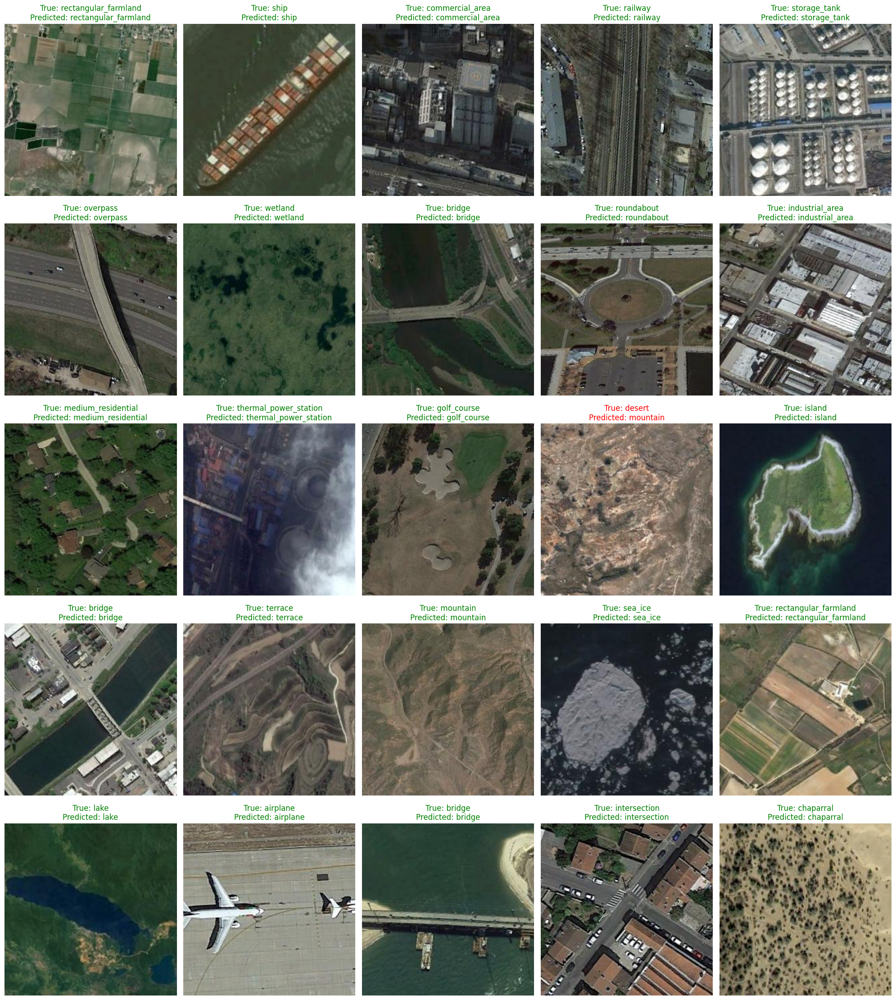

In [ ]:
import io
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt


def show_predictions(rows, cols):
    """
    Displays predictions and the class names

    Args:
        rows: number of rows to be displayed
        cols: number of columns to be displayed
    """
    samples_for_display = our_dataset['test'].shuffle(seed=42).select(np.arange(rows * cols))
    processed_samples_for_prediction = samples_for_display.with_transform(transforms)
    model_output = trainer.predict(processed_samples_for_prediction)
    predicted_ids = np.argmax(model_output.predictions, axis=1)

    fig = plt.figure(figsize=(cols * 4, rows * 4.5))
    for i in range(min(rows * cols, len(samples_for_display))):
        pil_image = samples_for_display[i]['image'] 
        img_to_show = pil_image

        if img_to_show.mode != 'RGB':
            img_to_show = img_to_show.convert('RGB')

        true_label_id = samples_for_display[i]['label']
        predicted_label_id = predicted_ids[i]
        true_class_name = id2label.get(true_label_id, f"ID {true_label_id}")
        predicted_class_name = id2label.get(predicted_label_id, f"ID {predicted_label_id}")
        
        title_text = f"True: {true_class_name}\nPredicted: {predicted_class_name}"
        color = 'green' if true_label_id == predicted_label_id else 'red'

        fig.add_subplot(rows, cols, i + 1)
        plt.imshow(img_to_show)
        plt.title(title_text, color=color)
        plt.axis('off')

    plt.tight_layout()
    plt.show()

show_predictions(rows=5, cols=5)

In [24]:
final_model_save_path = "./vit_model"
trainer.save_model(final_model_save_path)
print(f"Model saved to {final_model_save_path}")

Model saved to ./vit_model
